In [2]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import os
import skimage.exposure
import skimage.io
import skimage.color
import skimage.filters
from PIL import Image
from matplotlib.pyplot import imshow, show, subplot, figure, gray, title, axis

In [3]:
from google.colab.patches import cv2_imshow

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
cd "/content/drive/MyDrive"

/content/drive/MyDrive


In [6]:
!unzip 4_motion_tracking.zip -d /content/dataset 

Archive:  4_motion_tracking.zip
  inflating: /content/dataset/4_motion_tracking/fishes.avi  
  inflating: /content/dataset/4_motion_tracking/fishes.mpg  
 extracting: /content/dataset/4_motion_tracking/fishes_frames.zip  
  inflating: /content/dataset/4_motion_tracking/motor.avi  
  inflating: /content/dataset/4_motion_tracking/motor.mpg  
 extracting: /content/dataset/4_motion_tracking/motor_frames.zip  
 extracting: /content/dataset/4_motion_tracking/sec07_mot_avi.zip  
 extracting: /content/dataset/4_motion_tracking/sec07_mot_mpg.zip  


In [7]:
cd "../../"

/content


In [8]:
cd "/content/dataset/4_motion_tracking"

/content/dataset/4_motion_tracking


In [9]:
ls

fishes.avi         fishes.mpg  motor_frames.zip  sec07_mot_avi.zip
fishes_frames.zip  motor.avi   motor.mpg         sec07_mot_mpg.zip


In [ ]:
""""
Optical flow is the pattern of apparent motion of image objects between two consecutive frames 
caused by the movement of object or camera. It is 2D vector field where each vector is a 
displacement vector showing the movement of points from first frame to second
"""

def draw_flow ( img , flow , step = 16):
    h, w = img.shape[:2]
    y, x = np.mgrid[step / 2:h:step, step / 2:w:step].reshape(2, -1).astype(int)
    fx, fy = flow[y, x].T
    lines = np.vstack([x, y, x + fx, y + fy]).T.reshape(-1, 2, 2)
    lines = np.int32(lines + 0.5)
    vis = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    cv2.polylines(vis, lines, 0, (0, 255, 0))
    for (x1, y1), (x2, y2) in lines:
        cv2.circle(vis, (x1, y1), 1, (0, 255, 0), -1)
    return vis

/content/dataset/4_motion_tracking/fishes.mpg


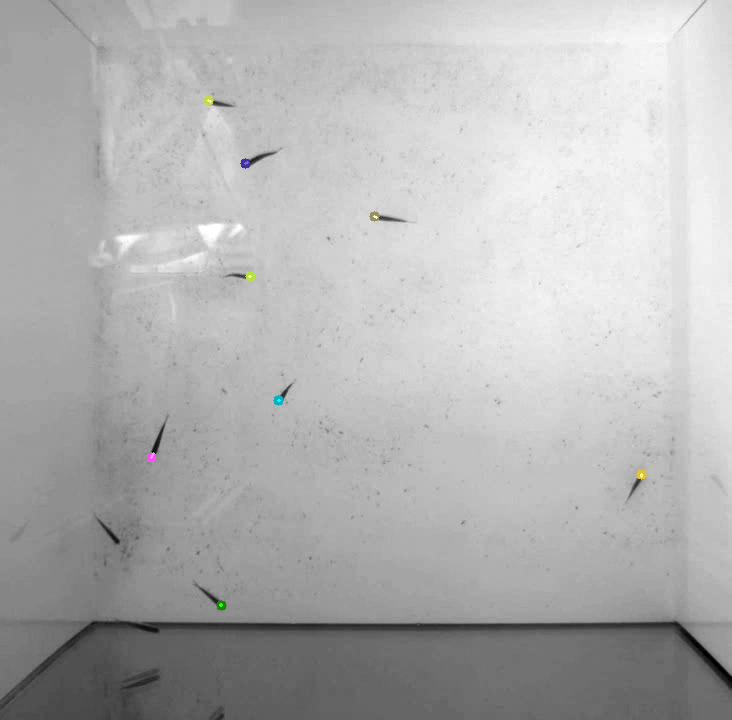

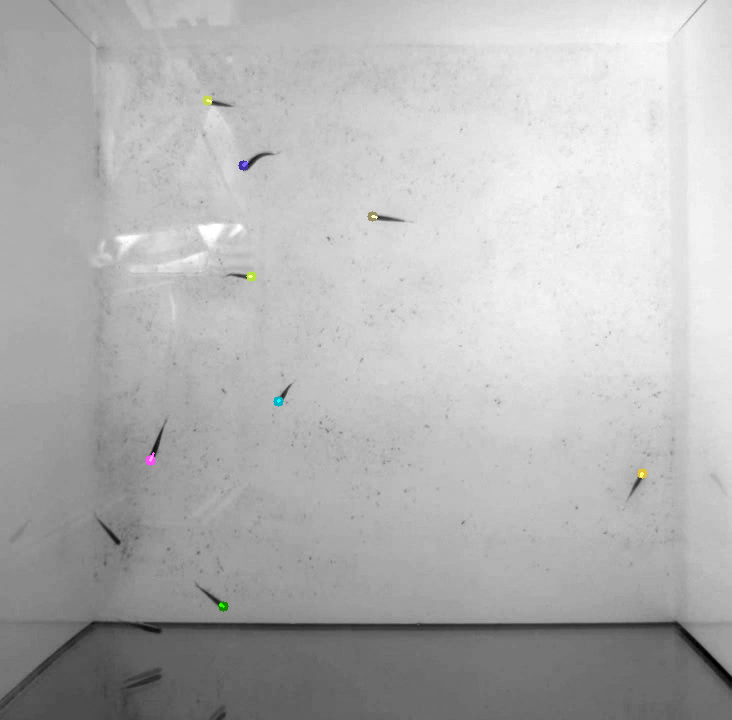

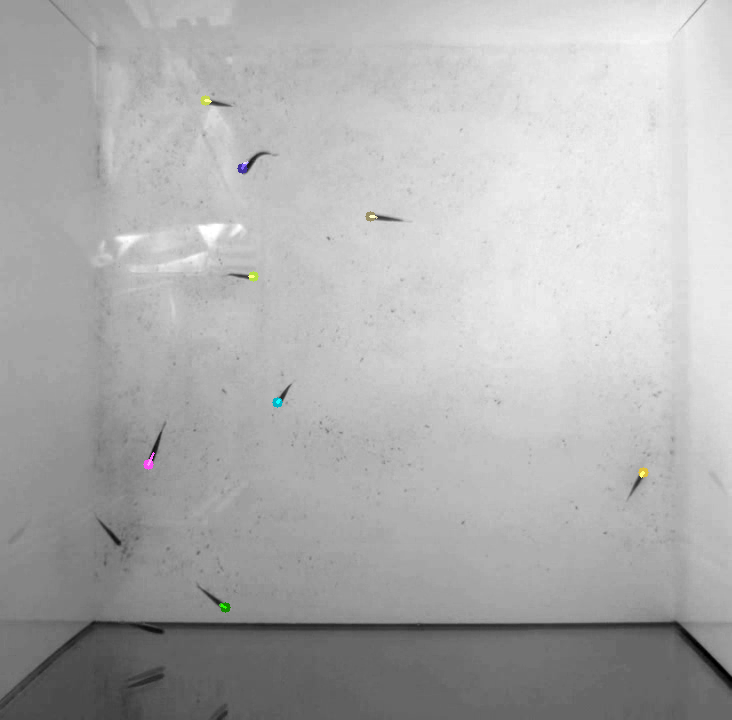

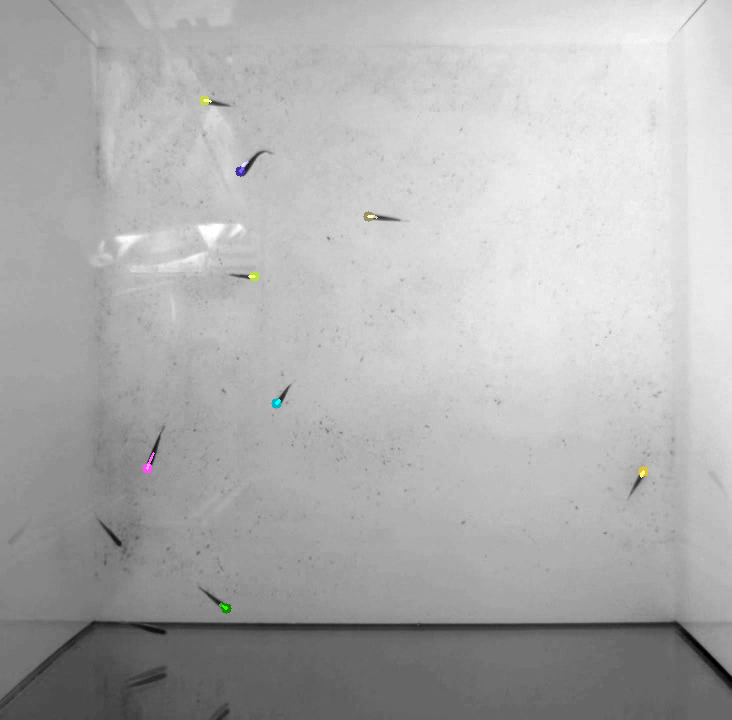

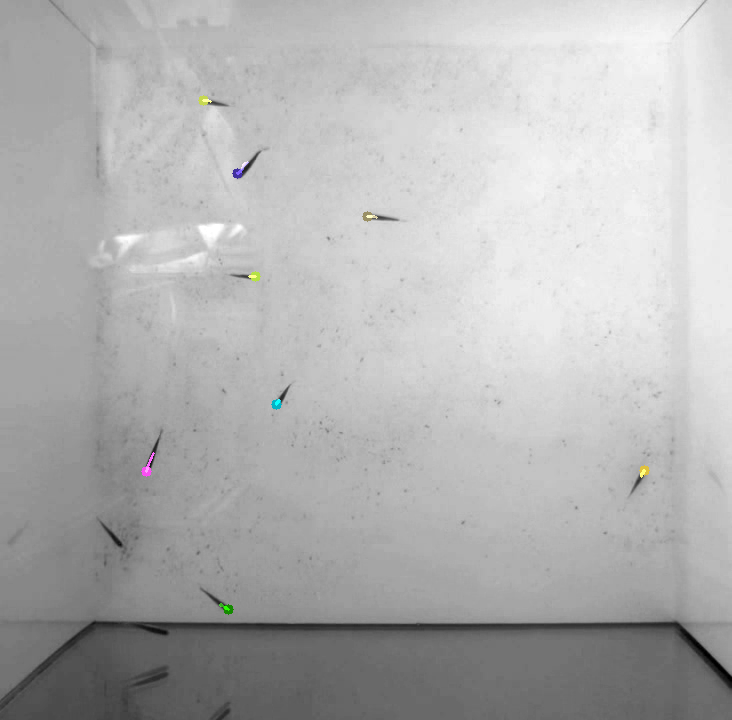

...

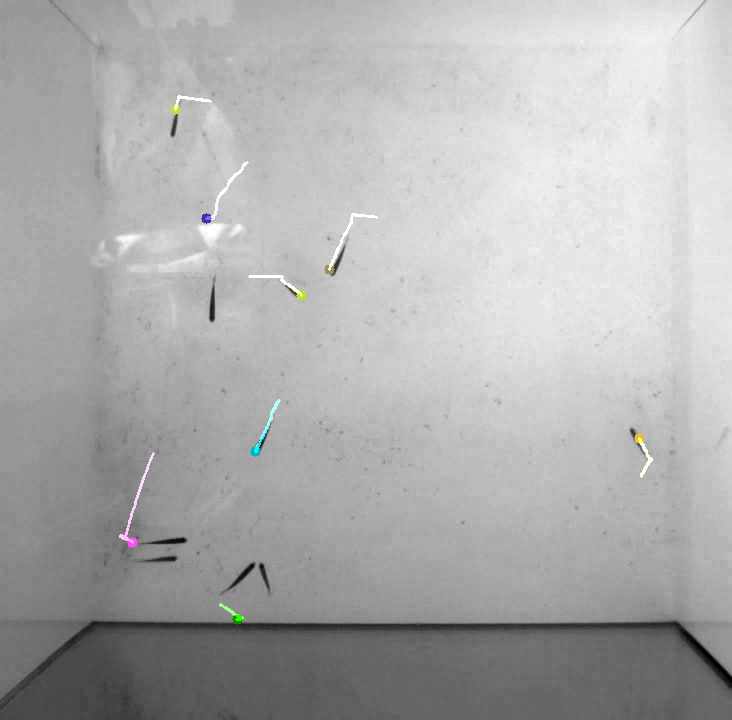

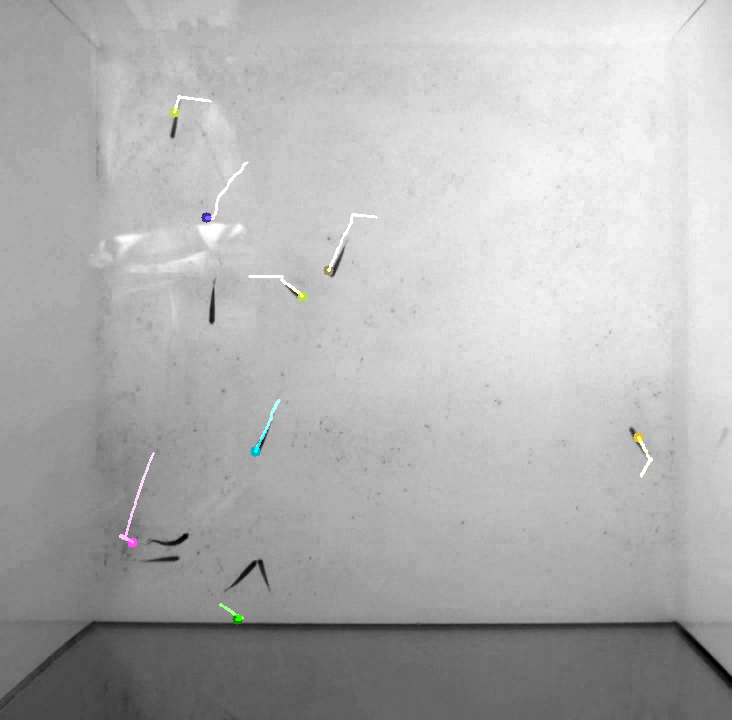

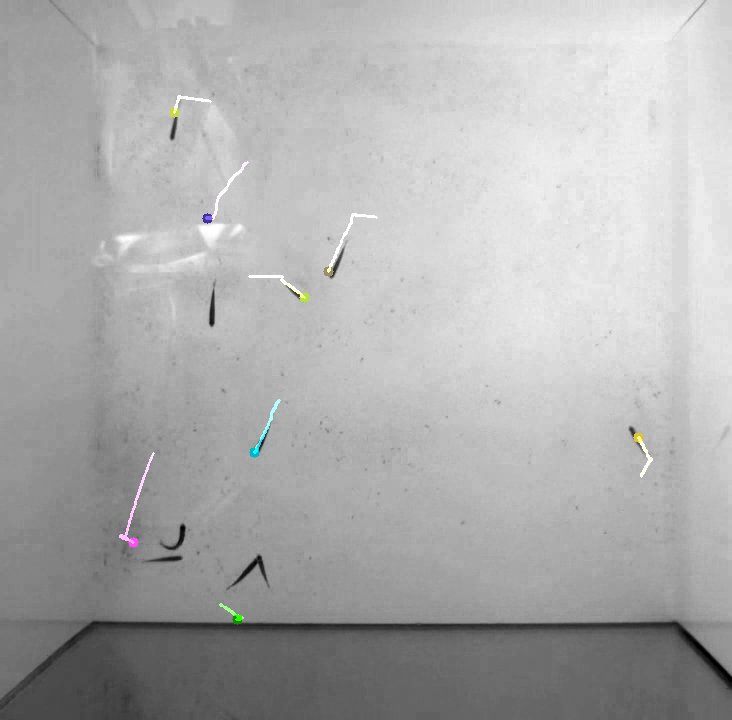

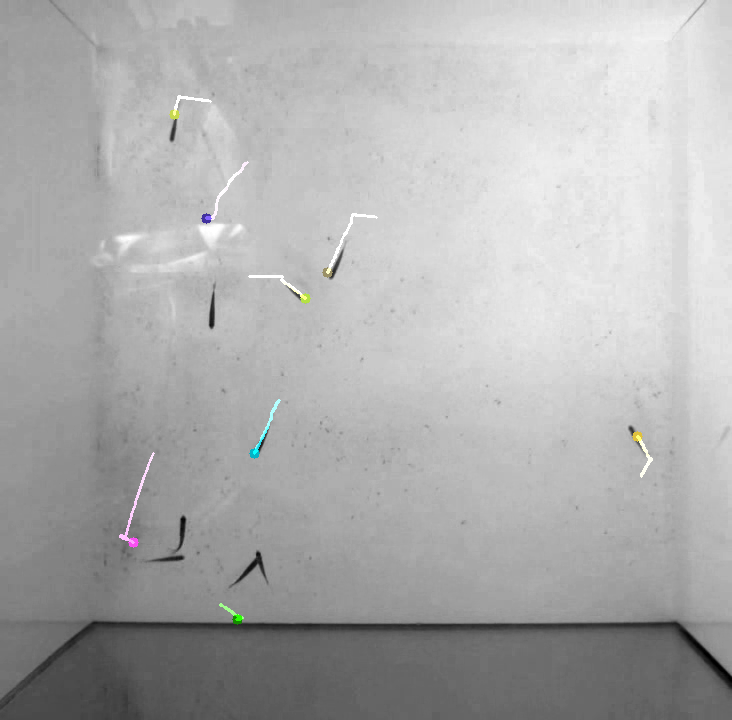

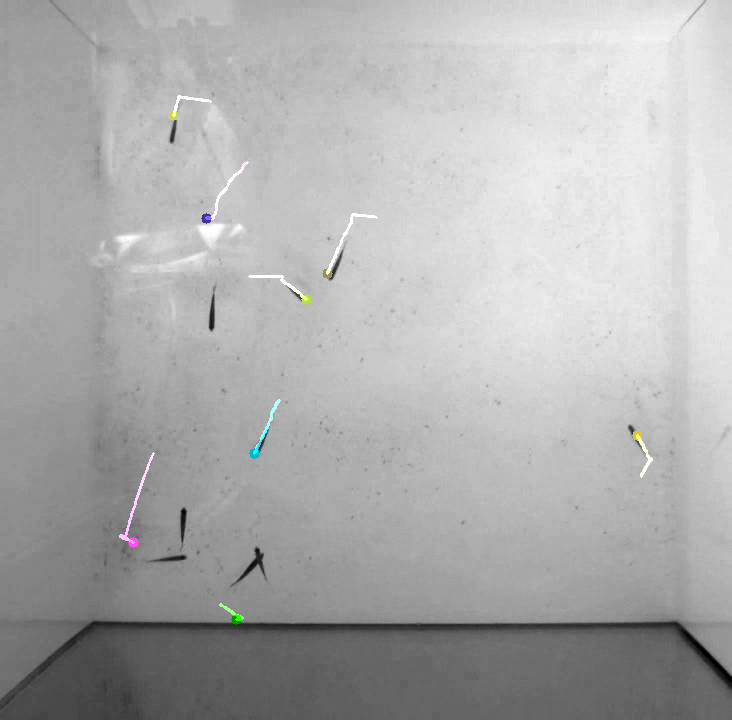

In [59]:
video_path = '/content/dataset/4_motion_tracking/fishes.mpg'
print(video_path)
new_path = os.path.splitext(video_path)[0]
# cap = cv2.VideoCapture('Input\{}'.format(video_path))
cap = cv2.VideoCapture(video_path)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create VideoWriter object
writer = cv2.VideoWriter('Output\Flow_{}.avi'.format(new_path), cv2.VideoWriter_fourcc(*'DIVX'), 20,
                          (width, height))
writer2 = cv2.VideoWriter('Output\Points_Tracking_{}.avi'.format(new_path), cv2.VideoWriter_fourcc(*'DIVX'), 20,
                          (width, height))
# Points Tracking

# params for ShiTomasi corner detection
# A low maxCorners parameter leads to unidentified features
# qualityLevel is a value between 0-1 which denotes the minimal quality threshold
# Whereas a higher quality level is very restricted

feature_params = dict(maxCorners=100,  # How many pts. to locate
                      qualityLevel=0.40,  # b/w 0 & 1, min. quality below which everyone is rejected
                      minDistance=7,  # Min eucledian distance b/w corners detected
                      blockSize=7)  # Size of an average block for computing a derivative covariation matrix over each pixel neighborhood
# Parameters for lucas kanade optical flow
# Detect the motion of specific points or the aggregated motion of regions by modifying
# the winSize argument. This determines the integration window size. Small windows are more sensitive to noise
# and may miss larger motions. Large windows will “survive” an occlusion.In the other direction,
# a narrow window size of 3x3 is more precise and “sticks” to the objects
# criteria has two interesting parameters here - the max number (10 above) of iterations and epsilon (0.03 above).
# More iterations means a more exhaustive search, and a smaller epsilon finishes earlier.
# These are primarily useful in exchanging speed vs accuracy, but mainly stay the same.

lk_params = dict(winSize=(15, 15),  # size of the search window at each pyramid level
                  maxLevel=2,# 0, pyramids are not used (single level), if set to 1, two levels are used, and so on
                  criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Create some random colors
color = np.random.randint(0, 255, (100, 3))

# Check if camera opened successfully
if (cap.isOpened() == False):
    print("Error opening video stream ")

# Take first frame and find corners in it
ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(old_frame)

prvs = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
hsv = np.zeros_like(old_frame)
hsv[..., 1] = 255

while (cap.isOpened()):
    ret, frame = cap.read()
    if type(frame) == type(None):
        break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    flow = cv2.calcOpticalFlowFarneback(prvs, frame_gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang * 180 / np.pi / 2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    # write the flipped frame

    #rgb2 =draw_flow(frame_gray, flow)
    rgb_resized = cv2.resize(rgb, (width, height))
    #rgb2_resized = cv2.resize(rgb2, (width, height))
    #cv2.imshow('frame Optic Flow ', rgb2_resized)
    # cv2_imshow(rgb_resized)
    # writer.write(rgb_resized)

    # calculate optical flow
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    if p1 is None:
        p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)
        p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)
    # Select good points
    good_new = p1[st == 1]
    good_old = p0[st == 1]

    # draw the tracks
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.ravel()
        c, d = old.ravel()
        mask = cv2.line(mask, (a.astype(int), b.astype(int)), (c.astype(int), d.astype(int)), color[i].tolist(), 2)
        frame = cv2.circle(frame, (a.astype(int), b.astype(int)), 5, color[i].tolist(), -1)
    Mtrack = cv2.add(frame, mask)

    cv2_imshow(Mtrack)
    writer2.write(Mtrack)

    key = cv2.waitKey(1)
    if key % 256 == 27:
        break

    prvs = frame_gray
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1, 1, 2)
# When everything done, release
# the video capture object
cap.release()

# Closes all the frames
# cv2.destroyAllWindows()

/content/dataset/4_motion_tracking/motor.mpg


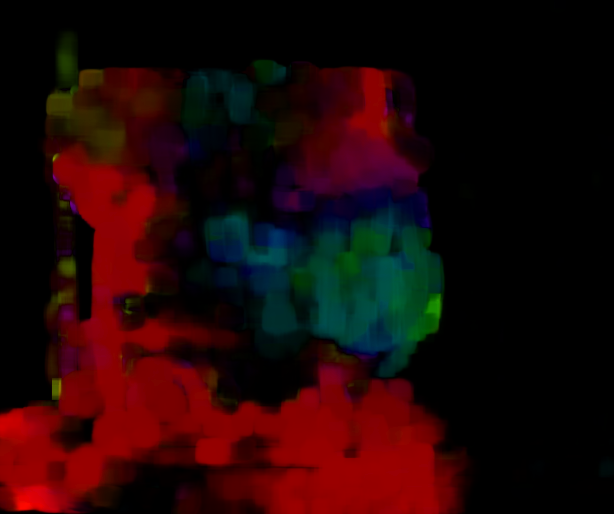

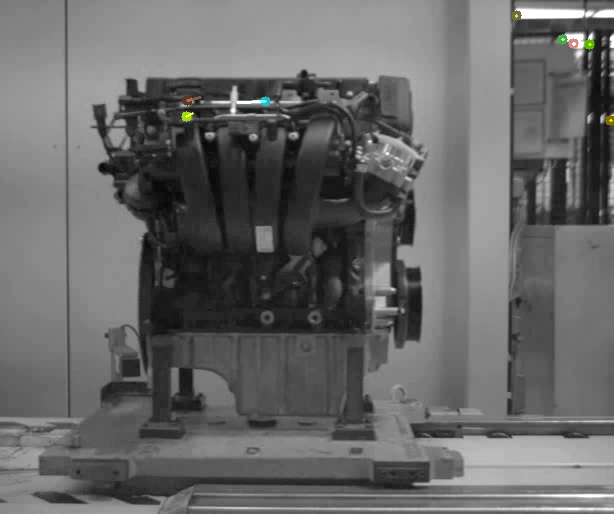

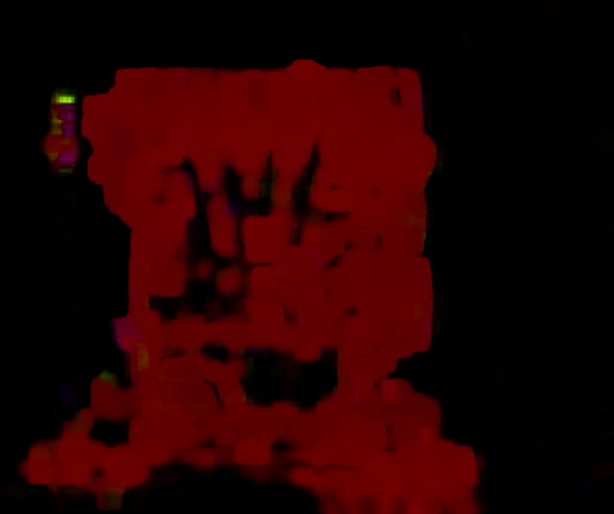

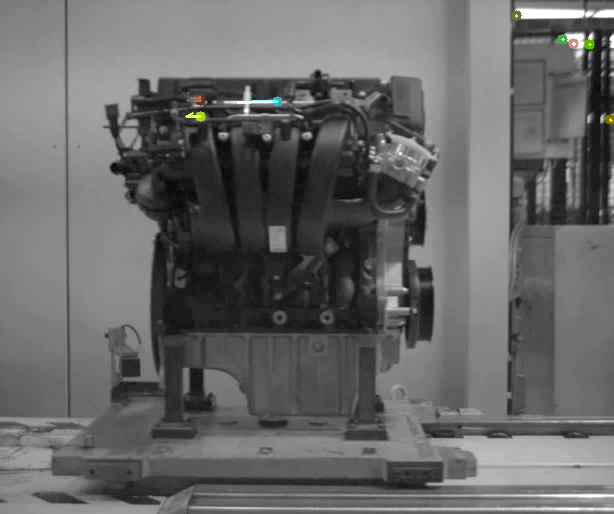

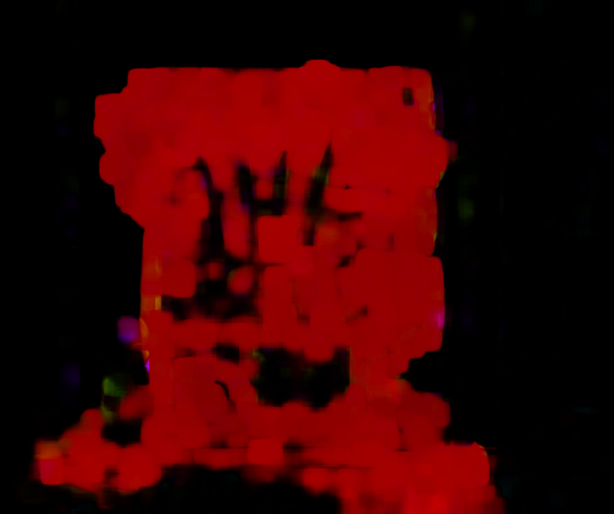

...

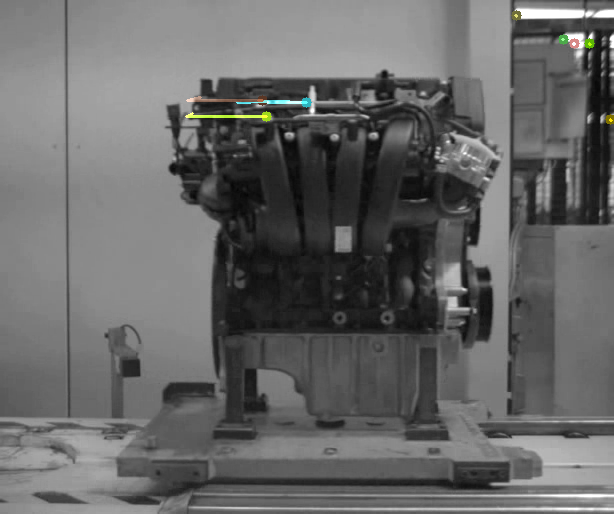

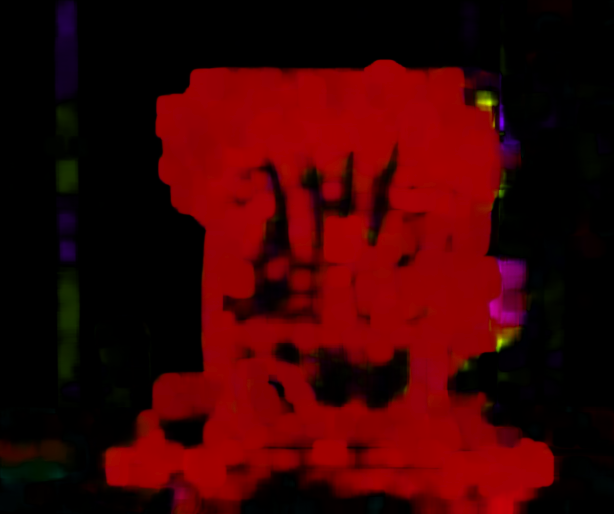

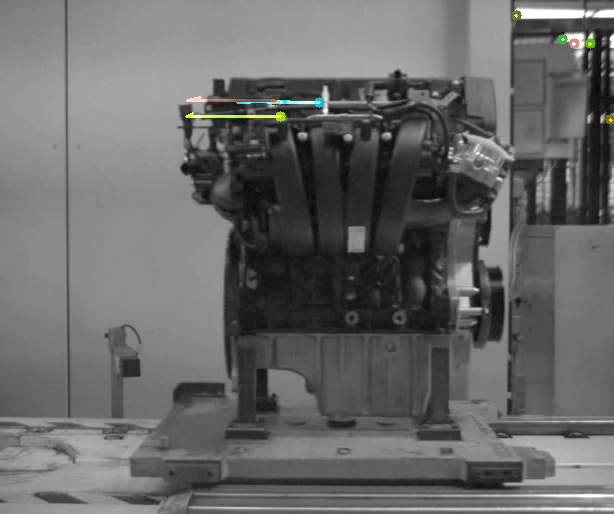

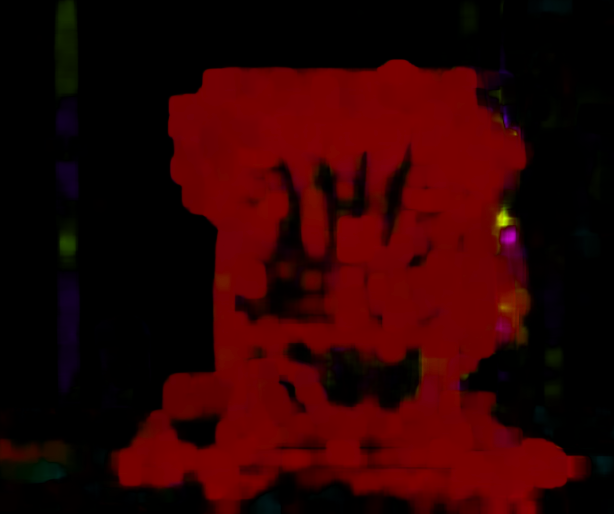

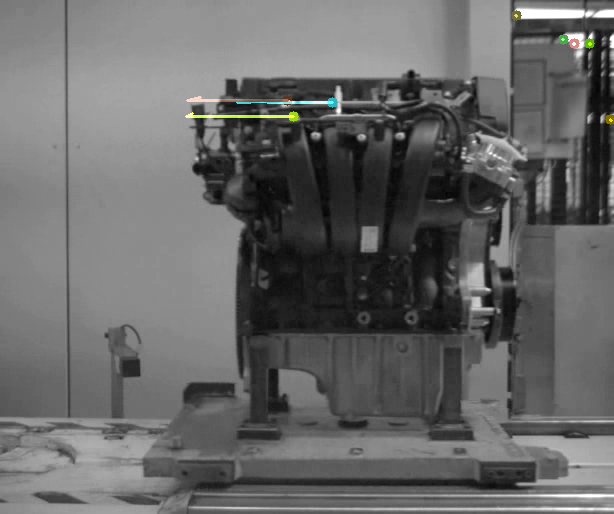

In [60]:
video_path = '/content/dataset/4_motion_tracking/motor.mpg'
print(video_path)
new_path = os.path.splitext(video_path)[0]
# cap = cv2.VideoCapture('Input\{}'.format(video_path))
cap = cv2.VideoCapture(video_path)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create VideoWriter object
writer = cv2.VideoWriter('Output\Flow_{}.avi'.format(new_path), cv2.VideoWriter_fourcc(*'DIVX'), 20,
                          (width, height))
writer2 = cv2.VideoWriter('Output\Points_Tracking_{}.avi'.format(new_path), cv2.VideoWriter_fourcc(*'DIVX'), 20,
                          (width, height))
# Points Tracking

# params for ShiTomasi corner detection
# A low maxCorners parameter leads to unidentified features
# qualityLevel is a value between 0-1 which denotes the minimal quality threshold
# Whereas a higher quality level is very restricted

feature_params = dict(maxCorners=100,  # How many pts. to locate
                      qualityLevel=0.5,  # b/w 0 & 1, min. quality below which everyone is rejected
                      minDistance=7,  # Min eucledian distance b/w corners detected
                      blockSize=7)  # Size of an average block for computing a derivative covariation matrix over each pixel neighborhood
# Parameters for lucas kanade optical flow
# Detect the motion of specific points or the aggregated motion of regions by modifying
# the winSize argument. This determines the integration window size. Small windows are more sensitive to noise
# and may miss larger motions. Large windows will “survive” an occlusion.In the other direction,
# a narrow window size of 3x3 is more precise and “sticks” to the objects
# criteria has two interesting parameters here - the max number (10 above) of iterations and epsilon (0.03 above).
# More iterations means a more exhaustive search, and a smaller epsilon finishes earlier.
# These are primarily useful in exchanging speed vs accuracy, but mainly stay the same.

lk_params = dict(winSize=(15, 15),  # size of the search window at each pyramid level
                  maxLevel=2,# 0, pyramids are not used (single level), if set to 1, two levels are used, and so on
                  criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Create some random colors
color = np.random.randint(0, 255, (100, 3))

# Check if camera opened successfully
if (cap.isOpened() == False):
    print("Error opening video stream ")

# Take first frame and find corners in it
ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(old_frame)

prvs = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
hsv = np.zeros_like(old_frame)
hsv[..., 1] = 255

while (cap.isOpened()):
    ret, frame = cap.read()
    if type(frame) == type(None):
        break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    flow = cv2.calcOpticalFlowFarneback(prvs, frame_gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang * 180 / np.pi / 2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    # write the flipped frame

    #rgb2 =draw_flow(frame_gray, flow)
    rgb_resized = cv2.resize(rgb, (width, height))
    #rgb2_resized = cv2.resize(rgb2, (width, height))
    #cv2.imshow('frame Optic Flow ', rgb2_resized)
    cv2_imshow(rgb_resized)
    writer.write(rgb_resized)

    # calculate optical flow
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    if p1 is None:
        p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)
        p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)
    # Select good points
    good_new = p1[st == 1]
    good_old = p0[st == 1]

    # draw the tracks
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.ravel()
        c, d = old.ravel()
        mask = cv2.line(mask, (a.astype(int), b.astype(int)), (c.astype(int), d.astype(int)), color[i].tolist(), 2)
        frame = cv2.circle(frame, (a.astype(int), b.astype(int)), 5, color[i].tolist(), -1)
    Mtrack = cv2.add(frame, mask)

    cv2_imshow(Mtrack)
    writer2.write(Mtrack)

    key = cv2.waitKey(1)
    if key % 256 == 27:
        break

    prvs = frame_gray
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1, 1, 2)
# When everything done, release
# the video capture object
cap.release()

# Closes all the frames
# cv2.destroyAllWindows()